<h1><center>Hammaad 2237928</center></h1>
<center>DE CW NOTEBOOK</center>

<h2>Web Scraping data for Air pollution</h2>

Getting latitude and longitude of each city

In [10]:
import requests

def get_lat_lon(api_key,city_name,limit=1):
    BASE_URL = "http://api.openweathermap.org/geo/1.0/direct"
    url = f"{BASE_URL}?q={city_name}&limit={limit}&appid={api_key}"
    response = requests.get(url).json()
    lat=response[0]['lat']
    lon=response[0]['lon']
    return lat,lon

api_key = "a1cffafa176a92a84c228d49cef0a38b"
city_name = "Colombo"


response = get_lat_lon(api_key, city_name,limit=1)
print(response)


(6.9387469, 79.8541134)


Getting Air pollution Values with AQI 

In [28]:
import requests

def get_airPollution(api_key, lat, lon):
    BASE_URL = "http://api.openweathermap.org/data/2.5/air_pollution/history?"
    url = f"{BASE_URL}lat={lat}&lon={lon}&start=1546281000&end=1704047400&appid={api_key}"
    response = requests.get(url).json()
    return response

api_key = "a1cffafa176a92a84c228d49cef0a38b"
cities = ["Colombo","Matara","Nuwara Eliya","Monaragala","Kurunegala","Jaffna","Kandy"]

data=[]
for city_name in cities:
    lat,lon = get_lat_lon(api_key, city_name,limit=1)
    response = get_airPollution(api_key, lat, lon)    
    col=['Date-time','City','co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10','nh3','aqi']
    for i in response['list']:
        date=i['dt']
        current_date = datetime.utcfromtimestamp(date).strftime('%Y-%m-%d %H:%M:%S')
        i['dt']=current_date
        row=[i['dt'],city_name,i['components']['co'],i['components']['no'],i['components']['no2'],i['components']['o3'],i['components']['so2'],i['components']['pm2_5'],i['components']['pm10'],i['components']['nh3'],i['main']['aqi']]
        data.append(row)
        print(f"Scraped {city_name} data for {i['dt']}")
        
import pandas as pd
df=pd.DataFrame(data,columns=col)
df.to_csv('air_pollution.csv',index=False)


Scraped Colombo data for 2020-11-25 01:00:00
Scraped Colombo data for 2020-11-25 02:00:00
Scraped Colombo data for 2020-11-25 03:00:00
Scraped Colombo data for 2020-11-25 04:00:00
Scraped Colombo data for 2020-11-25 05:00:00
Scraped Colombo data for 2020-11-25 06:00:00
Scraped Colombo data for 2020-11-25 07:00:00
Scraped Colombo data for 2020-11-25 08:00:00
Scraped Colombo data for 2020-11-25 09:00:00
Scraped Colombo data for 2020-11-25 10:00:00
Scraped Colombo data for 2020-11-25 11:00:00
Scraped Colombo data for 2020-11-25 12:00:00
Scraped Colombo data for 2020-11-25 13:00:00
Scraped Colombo data for 2020-11-25 14:00:00
Scraped Colombo data for 2020-11-25 15:00:00
Scraped Colombo data for 2020-11-25 16:00:00
Scraped Colombo data for 2020-11-25 17:00:00
Scraped Colombo data for 2020-11-25 18:00:00
Scraped Colombo data for 2020-11-25 19:00:00
Scraped Colombo data for 2020-11-25 20:00:00
Scraped Colombo data for 2020-11-25 21:00:00
Scraped Colombo data for 2020-11-25 22:00:00
Scraped Co

Data only available from 2020 November onwards

<h2> Data Preprocessing </h2>

<h3>Data cleaning</h3>

Installing pyspark

In [2]:
! pip install pyspark



[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: pip install --upgrade pip


In [3]:
import findspark
findspark.init()
from pyspark.sql import SparkSession

spark = SparkSession.builder.appName('air_pollution').getOrCreate()

24/03/19 13:13:10 WARN Utils: Your hostname, Hammaads-MacBook-Air.local resolves to a loopback address: 127.0.0.1; using 192.168.1.140 instead (on interface en0)
24/03/19 13:13:10 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/03/19 13:13:11 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [8]:
data = spark.read.csv("uncleaned data/HCHO_data/col_mat_nuw_output.csv", header=True, inferSchema=True)
data.show()

+----------------------+--------------+----------+----------+
|0.00019698343957810148|Colombo Proper|2019-01-01|2019-01-02|
+----------------------+--------------+----------+----------+
|  2.625522171968594...|Colombo Proper|2019-01-02|2019-01-03|
|  9.852118897938794E-5|Colombo Proper|2019-01-03|2019-01-04|
|  2.099320518114242E-4|Colombo Proper|2019-01-04|2019-01-05|
|  1.785337298892930...|Colombo Proper|2019-01-05|2019-01-06|
|  1.082296700235670...|Colombo Proper|2019-01-06|2019-01-07|
|  3.926829280477309...|Colombo Proper|2019-01-07|2019-01-08|
|  9.153156350685351E-5|Colombo Proper|2019-01-08|2019-01-09|
|  1.205978992853015...|Colombo Proper|2019-01-09|2019-01-10|
|  1.297723562983258...|Colombo Proper|2019-01-10|2019-01-11|
|  2.239188166801278...|Colombo Proper|2019-01-11|2019-01-12|
|  1.569418094178759...|Colombo Proper|2019-01-12|2019-01-13|
|                  NULL|Colombo Proper|2019-01-13|2019-01-14|
|  1.336291906862603...|Colombo Proper|2019-01-14|2019-01-15|
|  6.374

In [13]:
data = spark.read.csv("uncleaned data/HCHO_data/col_mat_nuw_output.csv", header=False, inferSchema=True)
cols = ["HCHO Reading", "Location", "Current Date", "Next Date"]
data = data.toDF(*cols)
data.show()

+--------------------+--------------+------------+----------+
|        HCHO Reading|      Location|Current Date| Next Date|
+--------------------+--------------+------------+----------+
|1.969834395781014...|Colombo Proper|  2019-01-01|2019-01-02|
|2.625522171968594...|Colombo Proper|  2019-01-02|2019-01-03|
|9.852118897938794E-5|Colombo Proper|  2019-01-03|2019-01-04|
|2.099320518114242E-4|Colombo Proper|  2019-01-04|2019-01-05|
|1.785337298892930...|Colombo Proper|  2019-01-05|2019-01-06|
|1.082296700235670...|Colombo Proper|  2019-01-06|2019-01-07|
|3.926829280477309...|Colombo Proper|  2019-01-07|2019-01-08|
|9.153156350685351E-5|Colombo Proper|  2019-01-08|2019-01-09|
|1.205978992853015...|Colombo Proper|  2019-01-09|2019-01-10|
|1.297723562983258...|Colombo Proper|  2019-01-10|2019-01-11|
|2.239188166801278...|Colombo Proper|  2019-01-11|2019-01-12|
|1.569418094178759...|Colombo Proper|  2019-01-12|2019-01-13|
|                NULL|Colombo Proper|  2019-01-13|2019-01-14|
|1.33629

Added column headers

In [19]:
data.printSchema()

root
 |-- HCHO Reading: double (nullable = true)
 |-- Location: string (nullable = true)
 |-- Current Date: date (nullable = true)
 |-- Next Date: date (nullable = true)



Check for missing values (Nan or empty)

In [39]:
from pyspark.sql.functions import col

total=0
for col_name in data.columns:
    total=total+data.filter(col(col_name).isNull()).count()
    print(col_name, data.filter(col(col_name).isNull()).count())

print("\nMissing values Proportion",total/data.count()*100)


HCHO Reading 2419
Location 0
Current Date 0
Next Date 0

Missing values Proportion 44.15845198977729


Need to figure out the trend to decide if we need to drop or fill the missing values, and ifso its method

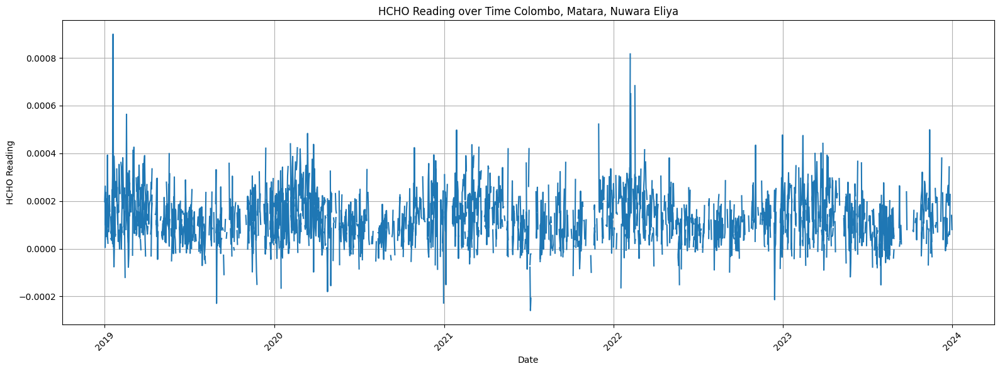

In [48]:
import matplotlib.pyplot as plt

plotting_data = data.select("Current Date", "HCHO Reading").toPandas()

plt.figure(figsize=(16, 6))
plt.plot(plotting_data["Current Date"], plotting_data["HCHO Reading"])
plt.title("HCHO Reading over Time Colombo, Matara, Nuwara Eliya")
plt.xlabel("Date")
plt.ylabel("HCHO Reading")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()

plt.show()


In [46]:
null_dates = data.filter(col("HCHO Reading").isNull()).select("Current Date").distinct()

print("Dates with null HCHO readings:")
null_dates.count()


Dates with null HCHO readings:


1290

We can see that there are 1290 different days where the servers were unable to read the data

In [47]:
dates = data.select("Current Date").distinct()

print("Dates with null HCHO readings:")
dates.count()


Dates with null HCHO readings:


1826

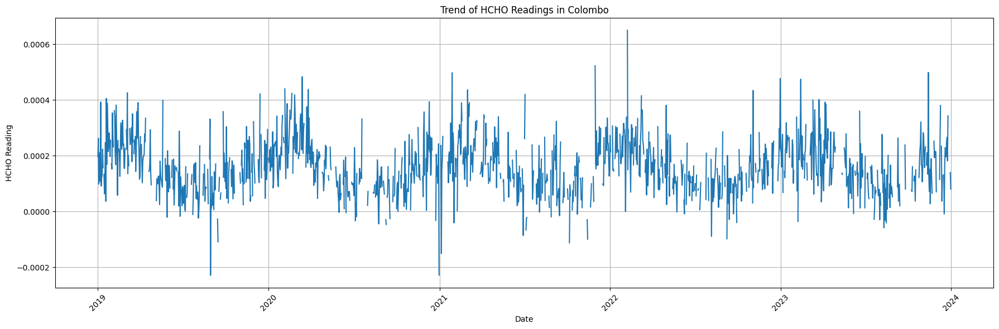

Missing values for Colombo:
+------------+--------------+------------+----------+
|HCHO Reading|      Location|Current Date| Next Date|
+------------+--------------+------------+----------+
|        NULL|Colombo Proper|  2019-01-13|2019-01-14|
|        NULL|Colombo Proper|  2019-01-29|2019-01-30|
|        NULL|Colombo Proper|  2019-02-04|2019-02-05|
|        NULL|Colombo Proper|  2019-02-14|2019-02-15|
|        NULL|Colombo Proper|  2019-03-01|2019-03-02|
|        NULL|Colombo Proper|  2019-03-02|2019-03-03|
|        NULL|Colombo Proper|  2019-03-09|2019-03-10|
|        NULL|Colombo Proper|  2019-03-18|2019-03-19|
|        NULL|Colombo Proper|  2019-03-21|2019-03-22|
|        NULL|Colombo Proper|  2019-04-03|2019-04-04|
|        NULL|Colombo Proper|  2019-04-14|2019-04-15|
|        NULL|Colombo Proper|  2019-04-15|2019-04-16|
|        NULL|Colombo Proper|  2019-04-16|2019-04-17|
|        NULL|Colombo Proper|  2019-04-17|2019-04-18|
|        NULL|Colombo Proper|  2019-04-19|2019-04-20|


In [69]:
colombo_data = data.filter(col("Location") == "Colombo Proper")

colombo_data_pandas = colombo_data.select("Current Date", "HCHO Reading").toPandas()

plt.figure(figsize=(18, 6))
plt.plot(colombo_data_pandas["Current Date"], colombo_data_pandas["HCHO Reading"])
plt.title("Trend of HCHO Readings in Colombo")
plt.xlabel("Date")
plt.ylabel("HCHO Reading")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

missing_values_colombo = colombo_data.filter(col("HCHO Reading").isNull())
print("Missing values for Colombo:")
missing_values_colombo.show()

we can see in colombo there is a trend, usually in the middel of the year the HCHO readings are quite lower and it begains to rise durin the third quarter of the year,lets see the details for each year 

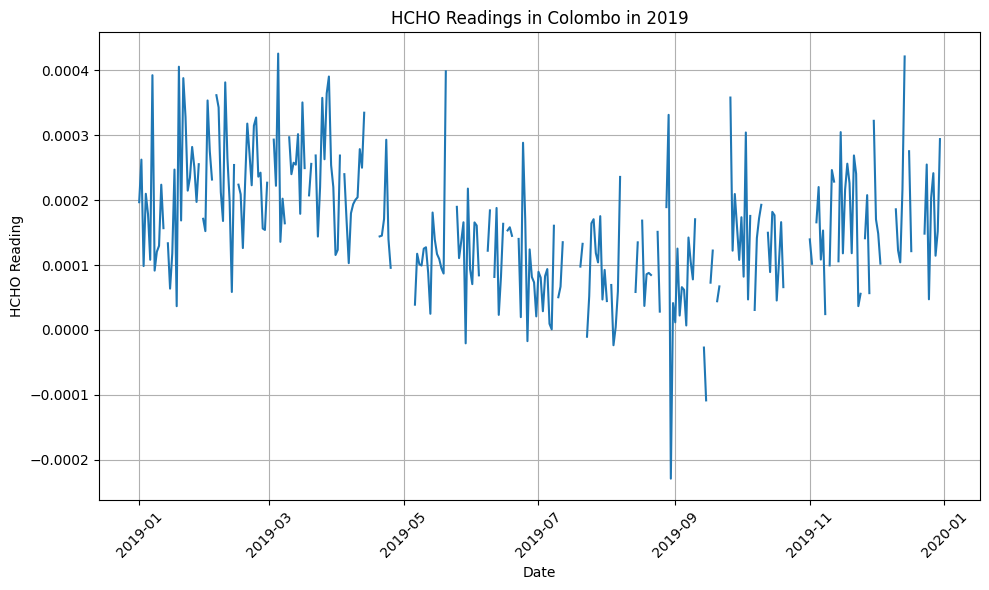

In [82]:
plt.figure(figsize=(10, 6))
plt.plot(colombo_2019_pandas["Current Date"], colombo_2019_pandas["HCHO Reading"])
plt.title("HCHO Readings in Colombo in 2019")
plt.xlabel("Date")
plt.ylabel("HCHO Reading")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()



Fill the missing values based on each location

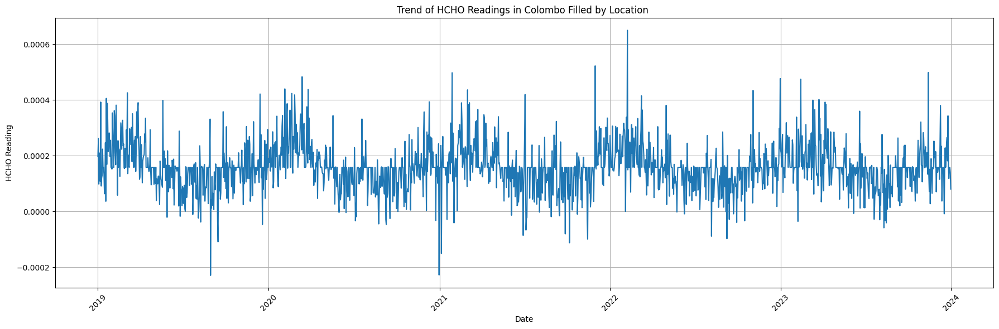

Missing values for Colombo:
+------------+--------+------------+---------+
|HCHO Reading|Location|Current Date|Next Date|
+------------+--------+------------+---------+
+------------+--------+------------+---------+



In [88]:
from pyspark.sql.functions import col, mean
colombo_data = data.filter(col("Location") == "Colombo Proper")

mean_hcho = colombo_data.select(mean("HCHO Reading")).collect()[0][0]
filled_data = colombo_data.fillna(mean_hcho, subset=["HCHO Reading"])

colombo_data_pandas = filled_data.select("Current Date", "HCHO Reading").toPandas()

plt.figure(figsize=(18, 6))
plt.plot(colombo_data_pandas["Current Date"], colombo_data_pandas["HCHO Reading"])
plt.title("Trend of HCHO Readings in Colombo Filled by Location ")
plt.xlabel("Date")
plt.ylabel("HCHO Reading")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

missing_values_colombo = filled_data.filter(col("HCHO Reading").isNull())
print("Missing values for Colombo:")
missing_values_colombo.show()

When we fill the values as a location it is accurate next steps, therefore it countinues the original trend in the data.

In [1]:
import pyspark
import pyspark.sql as pyspark_sql
from pyspark import SparkConf

sc = pyspark.SparkContext.getOrCreate()
spark = pyspark_sql.SparkSession(sc)
data = spark.read.csv("uncleaned data/HCHO_data/col_mat_nuw_output.csv", header=False, inferSchema=True)
cols = ["HCHO Reading", "Location", "Current Date", "Next Date"]
data = data.toDF(*cols)
data.show()

24/03/08 15:08:35 WARN Utils: Your hostname, Hammaads-MacBook-Air.local resolves to a loopback address: 127.0.0.1; using 192.168.1.140 instead (on interface en0)
24/03/08 15:08:35 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/03/08 15:08:36 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


+--------------------+--------------+------------+----------+
|        HCHO Reading|      Location|Current Date| Next Date|
+--------------------+--------------+------------+----------+
|1.969834395781014...|Colombo Proper|  2019-01-01|2019-01-02|
|2.625522171968594...|Colombo Proper|  2019-01-02|2019-01-03|
|9.852118897938794E-5|Colombo Proper|  2019-01-03|2019-01-04|
|2.099320518114242E-4|Colombo Proper|  2019-01-04|2019-01-05|
|1.785337298892930...|Colombo Proper|  2019-01-05|2019-01-06|
|1.082296700235670...|Colombo Proper|  2019-01-06|2019-01-07|
|3.926829280477309...|Colombo Proper|  2019-01-07|2019-01-08|
|9.153156350685351E-5|Colombo Proper|  2019-01-08|2019-01-09|
|1.205978992853015...|Colombo Proper|  2019-01-09|2019-01-10|
|1.297723562983258...|Colombo Proper|  2019-01-10|2019-01-11|
|2.239188166801278...|Colombo Proper|  2019-01-11|2019-01-12|
|1.569418094178759...|Colombo Proper|  2019-01-12|2019-01-13|
|                NULL|Colombo Proper|  2019-01-13|2019-01-14|
|1.33629

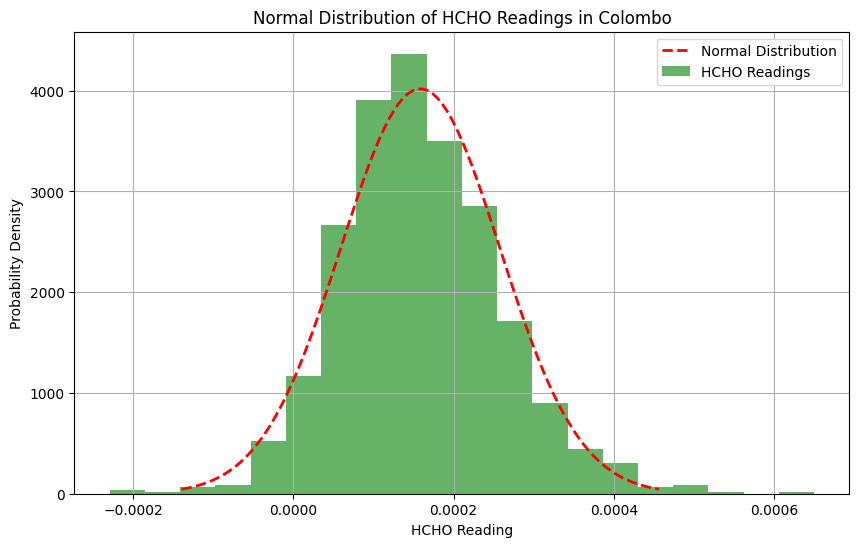

In [6]:
import numpy as np
from pyspark.sql.functions import col, mean
from scipy.stats import norm
import matplotlib.pyplot as plt

mean_hcho = colombo_data_pandas["HCHO Reading"].mean()
std_hcho = colombo_data_pandas["HCHO Reading"].std()

# Create a range of values for x-axis
x = np.linspace(mean_hcho - 3*std_hcho, mean_hcho + 3*std_hcho, 100)

# Calculate the corresponding probabilities for each value of x
y = norm.pdf(x, mean_hcho, std_hcho)

# Plot the histogram of HCHO readings
plt.figure(figsize=(10, 6))
plt.hist(colombo_data_pandas["HCHO Reading"], bins=20, density=True, alpha=0.6, color='g')

# Plot the normal distribution curve
plt.plot(x, y, 'r--', linewidth=2)

plt.title('Normal Distribution of HCHO Readings in Colombo')
plt.xlabel('HCHO Reading')
plt.ylabel('Probability Density')
plt.grid(True)
plt.legend(['Normal Distribution', 'HCHO Readings'])
plt.show()

We can see the average distribution of the mean is aroiund 0.0002 across 4 years, hence it has been used to fill the missing value

In [21]:
colombo_data = data.filter(col("Location") == "Colombo Proper")
mean_hcho = colombo_data.select(mean("HCHO Reading")).collect()[0][0]
colombo_data = colombo_data.fillna(mean_hcho, subset=["HCHO Reading"])


colombo_data_pandas = colombo_data.toPandas()
colombo_data_pandas.to_csv("colombo_hcho.csv", index=False)

repeat for all citites

In [59]:
data = spark.read.csv("uncleaned data/HCHO_data/col_mat_nuw_output.csv", header=False, inferSchema=True)
cols = ["HCHO Reading", "Location", "Current Date", "Next Date"]
data = data.toDF(*cols)
data.show()
city_data = data.filter(col("Location") == "Nuwara Eliya Proper")
mean_hcho = city_data.select(mean("HCHO Reading")).collect()[0][0]
city_data = city_data.fillna(mean_hcho, subset=["HCHO Reading"])


city_data_pandas = city_data.toPandas()
city_data_pandas.to_csv("Nuwara_Eliya_Proper_hcho.csv", index=False)
city_data.show()

+--------------------+--------------+------------+----------+
|        HCHO Reading|      Location|Current Date| Next Date|
+--------------------+--------------+------------+----------+
|1.969834395781014...|Colombo Proper|  2019-01-01|2019-01-02|
|2.625522171968594...|Colombo Proper|  2019-01-02|2019-01-03|
|9.852118897938794E-5|Colombo Proper|  2019-01-03|2019-01-04|
|2.099320518114242E-4|Colombo Proper|  2019-01-04|2019-01-05|
|1.785337298892930...|Colombo Proper|  2019-01-05|2019-01-06|
|1.082296700235670...|Colombo Proper|  2019-01-06|2019-01-07|
|3.926829280477309...|Colombo Proper|  2019-01-07|2019-01-08|
|9.153156350685351E-5|Colombo Proper|  2019-01-08|2019-01-09|
|1.205978992853015...|Colombo Proper|  2019-01-09|2019-01-10|
|1.297723562983258...|Colombo Proper|  2019-01-10|2019-01-11|
|2.239188166801278...|Colombo Proper|  2019-01-11|2019-01-12|
|1.569418094178759...|Colombo Proper|  2019-01-12|2019-01-13|
|                NULL|Colombo Proper|  2019-01-13|2019-01-14|
|1.33629

<h3>Check for outliers in each city</h3>

In [17]:
import pyspark
import pyspark.sql as pyspark_sql
from pyspark import SparkConf

sc = pyspark.SparkContext.getOrCreate()
spark = pyspark_sql.SparkSession(sc)


24/03/11 18:56:15 WARN Utils: Your hostname, Hammaads-MacBook-Air.local resolves to a loopback address: 127.0.0.1; using 192.168.1.140 instead (on interface en0)
24/03/11 18:56:15 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/03/11 18:56:16 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [26]:
data=spark.read.csv("cleaned data/Bibile_Monaragala_hcho.csv",header=True,inferSchema=True)
data.show()

+--------------------+------------------+------------+----------+
|        HCHO Reading|          Location|Current Date| Next Date|
+--------------------+------------------+------------+----------+
|1.264313797412045...|Bibile, Monaragala|  2019-01-01|2019-01-02|
|1.919914652467399E-5|Bibile, Monaragala|  2019-01-02|2019-01-03|
|2.811447935930283...|Bibile, Monaragala|  2019-01-03|2019-01-04|
|3.747998184385943E-5|Bibile, Monaragala|  2019-01-04|2019-01-05|
|-1.79826087934531...|Bibile, Monaragala|  2019-01-05|2019-01-06|
|1.457836896179902...|Bibile, Monaragala|  2019-01-06|2019-01-07|
|2.828590802546534...|Bibile, Monaragala|  2019-01-07|2019-01-08|
|1.264313797412045...|Bibile, Monaragala|  2019-01-08|2019-01-09|
|1.420850167050957...|Bibile, Monaragala|  2019-01-09|2019-01-10|
|1.264313797412045...|Bibile, Monaragala|  2019-01-10|2019-01-11|
|2.014587947072581E-5|Bibile, Monaragala|  2019-01-11|2019-01-12|
|1.582787663210183...|Bibile, Monaragala|  2019-01-12|2019-01-13|
|1.2643137

In [37]:
r=data.select("HCHO Reading").describe()
r.show()

+-------+--------------------+
|summary|        HCHO Reading|
+-------+--------------------+
|  count|                1826|
|   mean|1.264313797412028...|
| stddev|7.398431342501667E-5|
|    min|-2.39045708440244...|
|    max|5.348281140823137E-4|
+-------+--------------------+



In [30]:
from pyspark.sql.functions import mean,stddev,col,sqrt
df=data

mean_value = df.select(mean(col("HCHO Reading"))).collect()[0][0]
stddev_value = df.select(stddev(col("HCHO Reading"))).collect()[0][0]

# Define threshold for outliers (e.g., 3 standard deviations from the mean)
threshold = 3 * stddev_value

# Identify outliers
difference = sqrt(pow((col("HCHO Reading") - mean_value), 2))
outliers = df.filter(difference > threshold)

# Show outliers
outliers.show()
outliers.count()

+--------------------+------------------+------------+----------+
|        HCHO Reading|          Location|Current Date| Next Date|
+--------------------+------------------+------------+----------+
|4.183141429787661E-4|Bibile, Monaragala|  2019-07-03|2019-07-04|
|4.105507403533942E-4|Bibile, Monaragala|  2019-08-07|2019-08-08|
|-2.39045708440244...|Bibile, Monaragala|  2019-08-29|2019-08-30|
|-1.02826707006897...|Bibile, Monaragala|  2019-10-14|2019-10-15|
|-1.21090619359165...|Bibile, Monaragala|  2020-01-18|2020-01-19|
|4.111049981789254...|Bibile, Monaragala|  2020-02-05|2020-02-06|
|-1.00485084231338...|Bibile, Monaragala|  2020-02-25|2020-02-26|
|4.286214192743554...|Bibile, Monaragala|  2020-04-28|2020-04-29|
|3.845334830933597E-4|Bibile, Monaragala|  2020-07-16|2020-07-17|
| 4.39565224177669E-4|Bibile, Monaragala|  2020-12-13|2020-12-14|
|3.646058886863877E-4|Bibile, Monaragala|  2021-03-17|2021-03-18|
|-1.11445379233194...|Bibile, Monaragala|  2021-04-27|2021-04-28|
|3.5443292

34

There are outliers which are >3times standard deviation

Need to create a function where it removes outliers in all the datasets first for hcho reading

In [35]:
def remove_outliers(df):

    mean_value = df.select(mean(col("HCHO Reading"))).collect()[0][0]
    stddev_value = df.select(stddev(col("HCHO Reading"))).collect()[0][0]

    threshold = 3 * stddev_value

    difference = sqrt(pow((col("HCHO Reading") - mean_value), 2))
    outliers = df.filter(difference > threshold)
    cleaned_data = df.join(outliers, on="HCHO Reading", how="left_anti")

    return cleaned_data


Visualising the differences after removing outliers

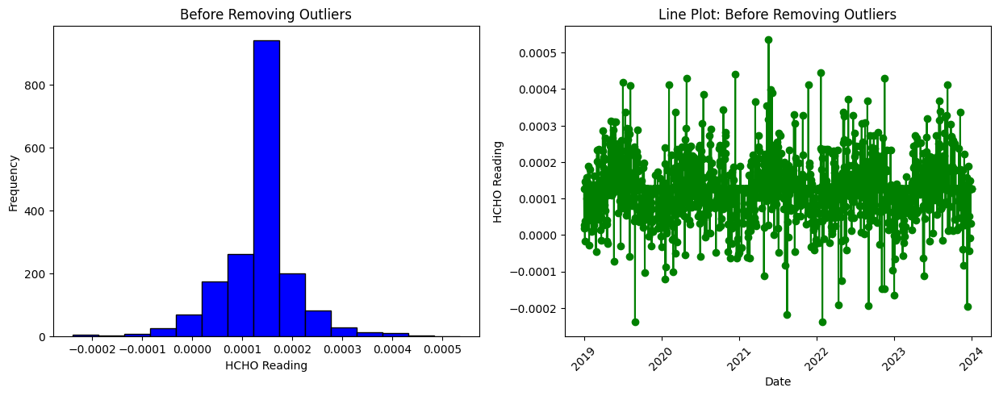

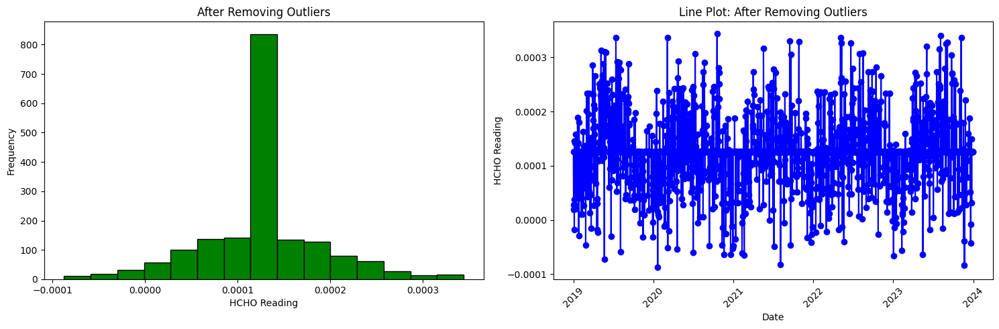

24/03/18 12:48:27 WARN Executor: Issue communicating with driver in heartbeater
org.apache.spark.SparkException: Exception thrown in awaitResult: 
	at org.apache.spark.util.SparkThreadUtils$.awaitResult(SparkThreadUtils.scala:56)
	at org.apache.spark.util.ThreadUtils$.awaitResult(ThreadUtils.scala:310)
	at org.apache.spark.rpc.RpcTimeout.awaitResult(RpcTimeout.scala:75)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:101)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:85)
	at org.apache.spark.storage.BlockManagerMaster.registerBlockManager(BlockManagerMaster.scala:80)
	at org.apache.spark.storage.BlockManager.reregister(BlockManager.scala:642)
	at org.apache.spark.executor.Executor.reportHeartBeat(Executor.scala:1223)
	at org.apache.spark.executor.Executor.$anonfun$heartbeater$1(Executor.scala:295)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at org.apache.spark.util.Utils$.logUncaughtExceptions(Utils.scala:1928)

In [36]:
pd_df_before = df.toPandas()

plt.figure(figsize=(15, 5))

# Histogram
plt.subplot(1, 2, 1)
plt.hist(pd_df_before["HCHO Reading"], bins=15, color='blue', edgecolor='black')
plt.title('Before Removing Outliers')
plt.xlabel('HCHO Reading')
plt.ylabel('Frequency')

# Line Plot
plt.subplot(1, 2, 2)
plt.plot(pd_df_before["Current Date"], pd_df_before["HCHO Reading"], color='green', marker='o')
plt.title('Line Plot: Before Removing Outliers')
plt.xlabel('Date')
plt.ylabel('HCHO Reading')
plt.xticks(rotation=45)

# Remove outliers
cleaned_df = remove_outliers(df)

# Convert cleaned PySpark DataFrame to Pandas DataFrame for plotting
pd_df_after = cleaned_df.toPandas()

# Plot after removing outliers
plt.figure(figsize=(15, 5))

# Histogram
plt.subplot(1, 2, 1)
plt.hist(pd_df_after["HCHO Reading"], bins=15, color='green', edgecolor='black')
plt.title('After Removing Outliers')
plt.xlabel('HCHO Reading')
plt.ylabel('Frequency')

# Line Plot
plt.subplot(1, 2, 2)
plt.plot(pd_df_after["Current Date"], pd_df_after["HCHO Reading"], color='blue', marker='o')
plt.title('Line Plot: After Removing Outliers')
plt.xlabel('Date')
plt.ylabel('HCHO Reading')
plt.xticks(rotation=45)

# Show plots
plt.tight_layout()
plt.show()

need to repeat for all cities in the cleaned dataset folder

In [14]:
import os
import pandas as pd
import numpy as np

from pyspark.sql.functions import mean, stddev, col, sqrt

input_folder = "cleaned data"
output_folder = "removed_outliers_data"

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

file_list = os.listdir(input_folder)

# Process each file
for file_name in file_list:
    if file_name.endswith('.csv'):
        input_file_path = os.path.join(input_folder, file_name)
        df = spark.read.csv(input_file_path, header=True, inferSchema=True)
        cleaned_df = remove_outliers(df)
        data=cleaned_df.toPandas()
        data.to_csv(f"{output_folder}/{file_name}", index=False)

removed the contents in the cleaned_data and resaved with the removed outliers data


<h3>Check for inconsistencies in data types</h3>

check for wrong ranges in data type ex hcho readings cannot be negative

In [22]:
file_path = os.path.join("cleaned data/colombo_hcho.csv")
df = spark.read.csv(file_path, header=True, inferSchema=True)

negative_hcho = df.filter(col("HCHO Reading") < 0)
if negative_hcho.count() > 0:
    print("Negative readings count: ",negative_hcho.count())
df.count()

Negative readings count:  45


1802

function to remove the negative values

In [23]:
def remove_negative_hcho(df):
    return df.filter(col("HCHO Reading") >= 0)


In [25]:
if not os.path.exists(output_folder):
    os.makedirs(output_folder)
    
for file_name in file_list:
    if file_name.endswith('.csv'):
        # Read CSV file into Spark DataFrame
        input_file_path = os.path.join(input_folder, file_name)
        df = spark.read.csv(input_file_path, header=True, inferSchema=True)

        cleaned_df = remove_negative_hcho(df)

        output_file_path = os.path.join(output_folder, file_name)
        data=cleaned_df.toPandas()
        data.to_csv(f"{output_folder}/{file_name}", index=False)

        print("Validated and saved the values to: ", output_file_path)


Validated and saved the values to:  removed_outliers_data/Jaffna_Proper_hcho.csv
Validated and saved the values to:  removed_outliers_data/Deniyaya_Matara_hcho.csv
Validated and saved the values to:  removed_outliers_data/Kandy_Proper_hcho.csv
Validated and saved the values to:  removed_outliers_data/Bibile_Monaragala_hcho.csv
Validated and saved the values to:  removed_outliers_data/Nuwara_Eliya_Proper_hcho.csv
Validated and saved the values to:  removed_outliers_data/Kurunegala_Proper_hcho.csv
Validated and saved the values to:  removed_outliers_data/colombo_hcho.csv


resaved the values to the cleaned dataset

need to view the graphs after validation

Text(0, 0.5, 'Frequency')

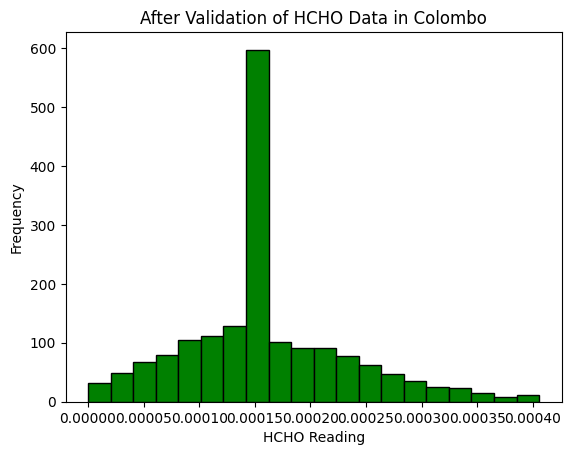

In [6]:
df=spark.read.csv("cleaned data/colombo_hcho.csv",header=True,inferSchema=True)
data=df.toPandas()
plt.hist(data["HCHO Reading"], bins=20, color='green', edgecolor='black')
plt.title('After Validation of HCHO Data in Colombo')
plt.xlabel('HCHO Reading')
plt.ylabel('Frequency')

<h4>Validate the date</h4>

In [14]:
from pyspark.sql.functions import col

data=spark.read.csv("cleaned data/colombo_hcho.csv",header=True,inferSchema=True)
duplicate_dates = data.groupBy("Next Date").count().filter(col("count") >1)
duplicate_dates.show()


+---------+-----+
|Next Date|count|
+---------+-----+
+---------+-----+



24/03/19 13:02:56 WARN Executor: Issue communicating with driver in heartbeater
org.apache.spark.SparkException: Exception thrown in awaitResult: 
	at org.apache.spark.util.SparkThreadUtils$.awaitResult(SparkThreadUtils.scala:56)
	at org.apache.spark.util.ThreadUtils$.awaitResult(ThreadUtils.scala:310)
	at org.apache.spark.rpc.RpcTimeout.awaitResult(RpcTimeout.scala:75)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:101)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:85)
	at org.apache.spark.storage.BlockManagerMaster.registerBlockManager(BlockManagerMaster.scala:80)
	at org.apache.spark.storage.BlockManager.reregister(BlockManager.scala:642)
	at org.apache.spark.executor.Executor.reportHeartBeat(Executor.scala:1223)
	at org.apache.spark.executor.Executor.$anonfun$heartbeater$1(Executor.scala:295)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at org.apache.spark.util.Utils$.logUncaughtExceptions(Utils.scala:1928)

24/03/19 13:03:06 ERROR Inbox: Ignoring error
org.apache.spark.SparkException: Exception thrown in awaitResult: 
	at org.apache.spark.util.SparkThreadUtils$.awaitResult(SparkThreadUtils.scala:56)
	at org.apache.spark.util.ThreadUtils$.awaitResult(ThreadUtils.scala:310)
	at org.apache.spark.rpc.RpcTimeout.awaitResult(RpcTimeout.scala:75)
	at org.apache.spark.rpc.RpcEnv.setupEndpointRefByURI(RpcEnv.scala:102)
	at org.apache.spark.rpc.RpcEnv.setupEndpointRef(RpcEnv.scala:110)
	at org.apache.spark.util.RpcUtils$.makeDriverRef(RpcUtils.scala:36)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.driverEndpoint$lzycompute(BlockManagerMasterEndpoint.scala:124)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.org$apache$spark$storage$BlockManagerMasterEndpoint$$driverEndpoint(BlockManagerMasterEndpoint.scala:123)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.isExecutorAlive$lzycompute$1(BlockManagerMasterEndpoint.scala:688)
	at org.apache.spark.storage.BlockManagerMasterE

no dulpicate date entries for both columns

In [20]:
from pyspark.sql.functions import col, to_date
from pyspark.sql.types import DateType

data = spark.read.csv("cleaned data/colombo_hcho.csv", header=True, inferSchema=True)
data = data.withColumn("Current Date", to_date(col("Current Date"), "yyyy-MM-dd"))

invalid_dates = data.filter(col("Current Date").isNull())

invalid_dates.show()

+------------+--------+------------+---------+
|HCHO Reading|Location|Current Date|Next Date|
+------------+--------+------------+---------+
+------------+--------+------------+---------+



24/03/19 13:05:26 ERROR Inbox: Ignoring error
org.apache.spark.SparkException: Exception thrown in awaitResult: 
	at org.apache.spark.util.SparkThreadUtils$.awaitResult(SparkThreadUtils.scala:56)
	at org.apache.spark.util.ThreadUtils$.awaitResult(ThreadUtils.scala:310)
	at org.apache.spark.rpc.RpcTimeout.awaitResult(RpcTimeout.scala:75)
	at org.apache.spark.rpc.RpcEnv.setupEndpointRefByURI(RpcEnv.scala:102)
	at org.apache.spark.rpc.RpcEnv.setupEndpointRef(RpcEnv.scala:110)
	at org.apache.spark.util.RpcUtils$.makeDriverRef(RpcUtils.scala:36)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.driverEndpoint$lzycompute(BlockManagerMasterEndpoint.scala:124)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.org$apache$spark$storage$BlockManagerMasterEndpoint$$driverEndpoint(BlockManagerMasterEndpoint.scala:123)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.isExecutorAlive$lzycompute$1(BlockManagerMasterEndpoint.scala:688)
	at org.apache.spark.storage.BlockManagerMasterE

In [6]:
from pyspark.sql.functions import col, year, month, dayofmonth

data = spark.read.csv("cleaned data/colombo_hcho.csv", header=True, inferSchema=True)
data = data.withColumn("year", year(col("Current Date")))
data = data.withColumn("month", month(col("Current Date")))
data = data.withColumn("day", dayofmonth(col("Current Date")))

data.select("month").distinct().show()
data.select("year").distinct().show()
data.select("day").distinct().show()

+-----+
|month|
+-----+
|   12|
|    1|
|    6|
|    3|
|    5|
|    9|
|    4|
|    8|
|    7|
|   10|
|   11|
|    2|
+-----+

+----+
|year|
+----+
|2023|
|2022|
|2019|
|2020|
|2021|
+----+

+---+
|day|
+---+
| 31|
| 28|
| 26|
| 27|
| 12|
| 22|
|  1|
| 13|
|  6|
| 16|
|  3|
| 20|
|  5|
| 19|
| 15|
|  9|
| 17|
|  4|
|  8|
| 23|
+---+
only showing top 20 rows



date is of correct range

need to create a function and update for other csv also

In [11]:
from pyspark.sql.functions import col, to_date
def validate_date(df):
    df = df.withColumn("Current Date", to_date(col("Current Date"), "yyyy-MM-dd"))
    df = df.dropDuplicates(["Current Date"])
    df = df.filter(col("Current Date").isNotNull())

    df = df.withColumn("Next Date", to_date(col("Next Date"), "yyyy-MM-dd"))
    df = df.dropDuplicates(["Next Date"])
    df = df.filter(col("Next Date").isNotNull())
    return df


In [16]:
import os
input_folder = "cleaned data"
output_folder = "validated_data"

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

file_list = os.listdir(input_folder)

# Process each file
for file_name in file_list:
    if file_name.endswith('.csv'):
        input_file_path = os.path.join(input_folder, file_name)
        df = spark.read.csv(input_file_path, header=True, inferSchema=True)
        cleaned_df = validate_date(df)
        
        
        output_file_path = os.path.join(output_folder, file_name)
        print("Validated date columns the values to: ", output_file_path)
        cleaned_df.toPandas().to_csv(output_file_path, index=False)

Validated date columns the values to:  validated_data/Jaffna_Proper_hcho.csv
Validated date columns the values to:  validated_data/Deniyaya_Matara_hcho.csv
Validated date columns the values to:  validated_data/Kandy_Proper_hcho.csv
Validated date columns the values to:  validated_data/Bibile_Monaragala_hcho.csv
Validated date columns the values to:  validated_data/Nuwara_Eliya_Proper_hcho.csv
Validated date columns the values to:  validated_data/Kurunegala_Proper_hcho.csv
Validated date columns the values to:  validated_data/colombo_hcho.csv


data validation is completed

<h3>EDA</h3>

<h4>Descrptive statistics<h4>

displaying the summary of HCHO reading for colombo

In [18]:
data=spark.read.csv("preprocessed_data/colombo_hcho.csv",header=True,inferSchema=True)
data.select("HCHO Reading").describe().show()

+-------+--------------------+
|summary|        HCHO Reading|
+-------+--------------------+
|  count|                1757|
|   mean|1.616377580572035...|
| stddev| 7.26429302558287E-5|
|    min|2.111934367094221...|
|    max|4.057500868150313E-4|
+-------+--------------------+



to compare between cities i will create a table, which would aid for comparison

In [108]:
def generate_summary(data):
    summary = data.describe().toPandas()

    median = data.selectExpr("percentile_approx(`HCHO Reading`, 0.5)").collect()[0][0]
    q1 = data.selectExpr("percentile_approx(`HCHO Reading`, 0.75)").collect()[0][0]
    q3 = data.selectExpr("percentile_approx(`HCHO Reading`, 0.25)").collect()[0][0]

    count = float(summary.iloc[0, 1])
    mean = float(summary.iloc[1, 1])
    std = float(summary.iloc[2, 1])
    min_val = float(summary.iloc[3, 1])
    max_val = float(summary.iloc[4, 1])

    location = data.select("Location").collect()[0][0]

    stats = {
        "Location": location,
        "count": count,
        "mean": mean,
        "std": std,
        "min": min_val,
        "max": max_val,
        "median": median,
        "q1": q1,
        "q3": q3
    }

    return stats


functions to extract the statistics and load to the dataframe

In [109]:
def merge_stats(stats_list):
    stats_dict = {}
    for stats in stats_list:
        location = stats['Location']
        del stats['Location'] 
        stats_dict[location] = stats

    df = pd.DataFrame(stats_dict).transpose()

    return df

In [123]:
all_stats = []
import os
input_folder = "preprocessed_data"
file_list = os.listdir(input_folder)

# Process each file
for file_name in file_list:
    if file_name.endswith('.csv'):
        input_file_path = os.path.join(input_folder, file_name)
        df = spark.read.csv(input_file_path, header=True, inferSchema=True)
        stats = generate_summary(df)
        all_stats.append(stats)
data = merge_stats(all_stats)
data["Location"] = data.index
data = data.reset_index(drop=True)

In [124]:
data

,count,mean,std,min,max,median,q1,q3,Location
0,1746.0,0.000110,0.000054,4.103467e-07,0.000314,0.000109,0.000131,0.000077,Jaffna Proper
1,1688.0,0.000096,0.000045,8.485600e-08,0.000304,0.000092,0.000092,0.000089,"Deniyaya, Matara"
2,1701.0,0.000114,0.000050,1.569671e-07,0.000310,0.000106,0.000120,0.000106,Kandy Proper
3,1729.0,0.000132,0.000057,1.461232e-07,0.000344,0.000126,0.000148,0.000114,"Bibile, Monaragala"
4,1702.0,0.000092,0.000036,4.363303e-07,0.000241,0.000088,0.000088,0.000088,Nuwara Eliya Proper
5,1749.0,0.000137,0.000058,1.433376e-07,0.000347,0.000134,0.000157,0.000108,Kurunegala Proper
6,1757.0,0.000162,0.000073,2.111934e-07,0.000406,0.000159,0.000192,0.000121,Colombo Proper


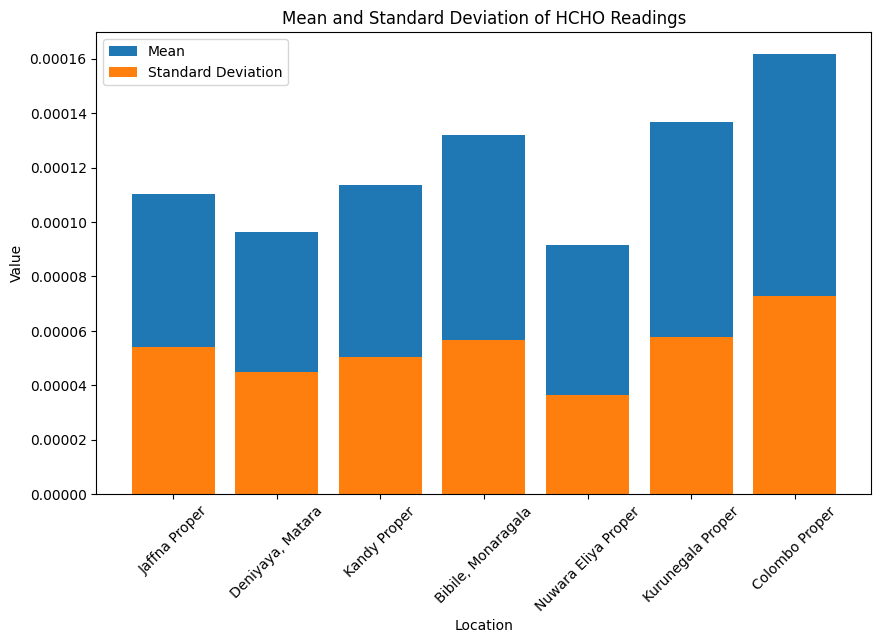

In [104]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.bar(data["Location"], data["mean"])
plt.bar(data["Location"], data["std"])
plt.title("Mean and Standard Deviation of HCHO Readings")
plt.xlabel("Location")
plt.ylabel("Value")
plt.xticks(rotation=45)
plt.legend(["Mean", "Standard Deviation"])
plt.show()


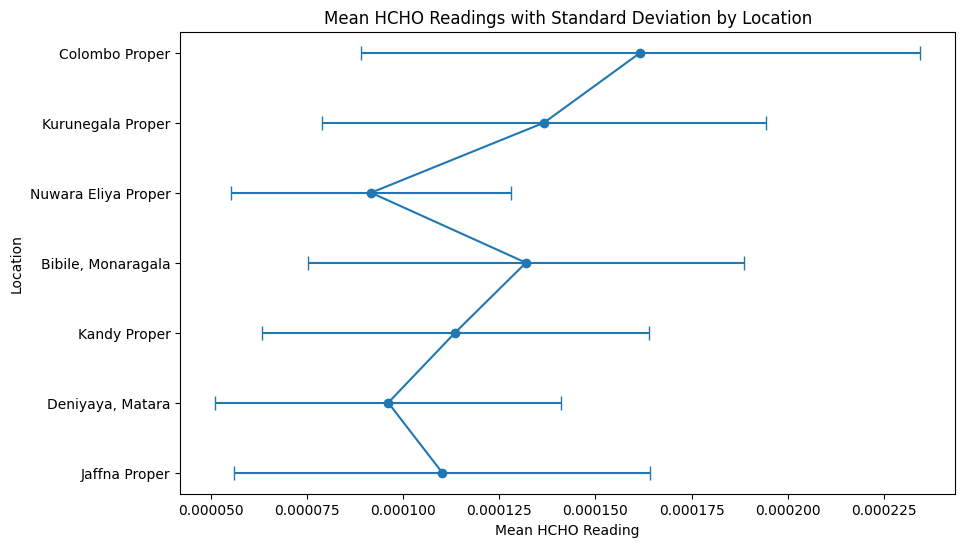

In [91]:
plt.figure(figsize=(10, 6))
plt.errorbar(df["mean"], df["Location"], xerr=df["std"], fmt='o', linestyle='-', capsize=5)
plt.title("Mean HCHO Readings with Standard Deviation by Location")
plt.xlabel("Mean HCHO Reading")
plt.ylabel("Location")
plt.show()


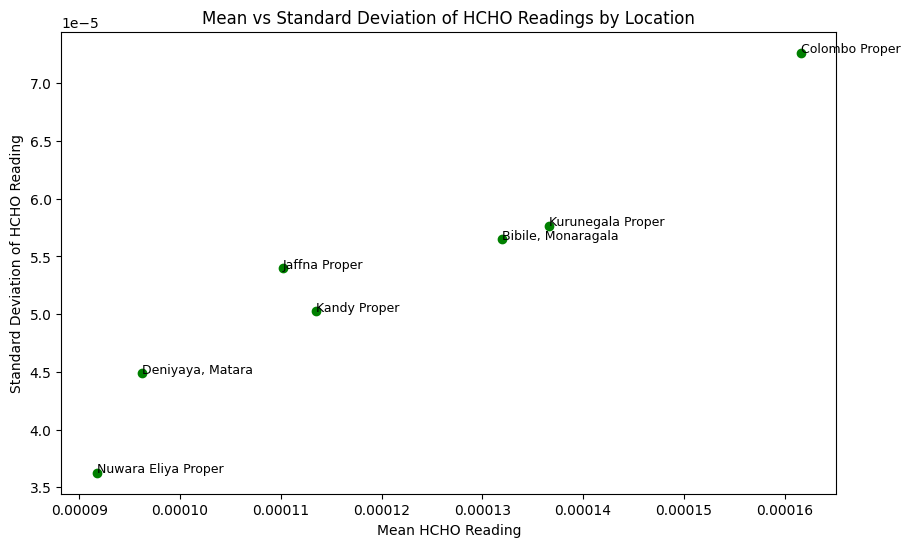

In [100]:
plt.figure(figsize=(10, 6))
plt.scatter(df["mean"], df["std"], color="green")
plt.title("Mean vs Standard Deviation of HCHO Readings by Location")
plt.xlabel("Mean HCHO Reading")
plt.ylabel("Standard Deviation of HCHO Reading")
for i, location in enumerate(df["Location"]):
    plt.text(df["mean"][i], df["std"][i], location, fontsize=9)
plt.show()


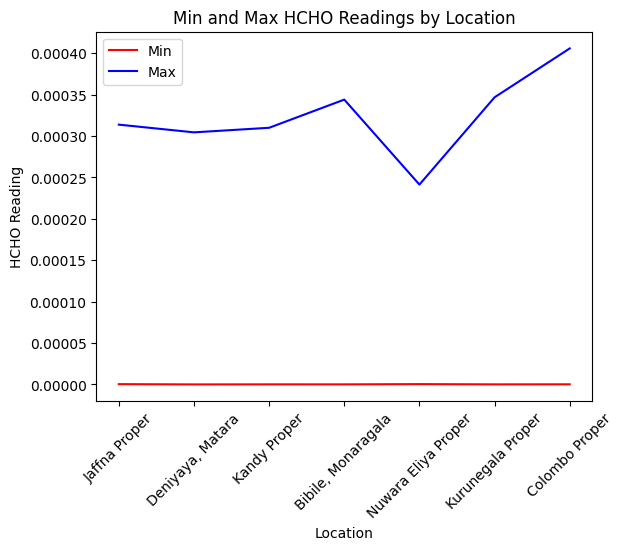

In [107]:
plt.plot(df["Location"], df["min"], color="red")
plt.plot(df["Location"], df["max"], color="blue")
plt.title("Min and Max HCHO Readings by Location")
plt.xlabel("Location")
plt.ylabel("HCHO Reading")
plt.xticks(rotation=45)
plt.legend(["Min", "Max"])
plt.show()

In [122]:
data

DataFrame[HCHO Reading: double, Current Date: date, Next Date: date]

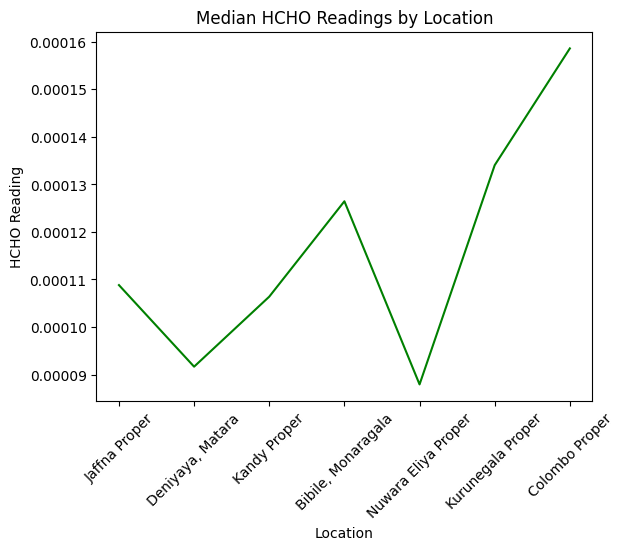

In [128]:
plt.plot(data["Location"], data["median"], color="green")
plt.title("Median HCHO Readings by Location")
plt.xlabel("Location")
plt.ylabel("HCHO Reading")
plt.xticks(rotation=45)
plt.show()

# Show plot